In [1]:
#####################
## Import Library ##
#####################
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
import seaborn as sns; sns.set()
import math
from math import sqrt

# estimators
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn import linear_model


# model metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler


# cross validation
from sklearn.model_selection import train_test_split

import warnings
def fxn():
    warnings.warn("deprecated", DeprecationWarning)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()
    
%matplotlib inline

In [2]:
#################
## Import Data ##
#################

# locate data
file = 'SeoulBikeData.csv'

# load data
data = pd.read_csv(file,parse_dates=['Date'])

In [3]:
##########################
## EDA & Pre-Processing ##
##########################

# number of rows and columns 
data.shape

(8760, 15)

In [4]:
# Remove duplicate data -- no duplicates
data = data.drop_duplicates()

In [5]:
# verify number of rows after duplicates dropped - confirmed
data.shape

(8760, 15)

In [6]:
# preview first 5 rows 
data.head()

,Date,Day,Rented_Bike_Count,Hour,Temperature(∞C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(∞C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-12-01,Friday,254,0,-5,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,Friday,204,1,-5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,Friday,173,2,-6,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-12-01,Friday,107,3,-6,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-12-01,Friday,78,4,-6,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [7]:
# all column headers 
data.columns

Index(['Date', 'Day', 'Rented_Bike_Count', 'Hour', 'Temperature(∞C)',
       'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
       'Dew point temperature(∞C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)',
       'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day'],
      dtype='object')

In [8]:
# basic information on all columns (data type and null)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Day                        8760 non-null   object        
 2   Rented_Bike_Count          8760 non-null   int64         
 3   Hour                       8760 non-null   int64         
 4   Temperature(∞C)            8760 non-null   int64         
 5   Humidity(%)                8760 non-null   int64         
 6   Wind speed (m/s)           8760 non-null   float64       
 7   Visibility (10m)           8760 non-null   int64         
 8   Dew point temperature(∞C)  8760 non-null   float64       
 9   Solar Radiation (MJ/m2)    8760 non-null   float64       
 10  Rainfall(mm)               8760 non-null   float64       
 11  Snowfall (cm)              8760 non-null   float64       
 12  Season

In [9]:
# basic statistics on numeric columns
data.describe()

,Rented_Bike_Count,Hour,Temperature(∞C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(∞C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.580251,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.720990,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.000000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.000000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.000000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.000000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.000000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [10]:
# Rename columns 
data = data.rename(columns={'Temperature(∞C)': 'Temp', 'Dew point temperature(∞C)': 'dew_pt_temp'})

In [11]:
# shows what type the data was read in as
data.dtypes

Date                       datetime64[ns]
Day                                object
Rented_Bike_Count                   int64
Hour                                int64
Temp                                int64
Humidity(%)                         int64
Wind speed (m/s)                  float64
Visibility (10m)                    int64
dew_pt_temp                       float64
Solar Radiation (MJ/m2)           float64
Rainfall(mm)                      float64
Snowfall (cm)                     float64
Seasons                            object
Holiday                            object
Functioning Day                    object
dtype: object

In [12]:
# Create translation tables for day, season, holiday, funcationing day

data['Seasons']=np.where(data['Seasons'] == 'Spring', 1, data['Seasons'])
data['Seasons']=np.where(data['Seasons'] == 'Summer', 2, data['Seasons'])
data['Seasons']=np.where(data['Seasons'] == 'Autumn', 3, data['Seasons'])
data['Seasons']=np.where(data['Seasons'] == 'Winter', 4, data['Seasons'])
data['Holiday']=np.where(data['Holiday'] == 'No Holiday', 0, data['Holiday'])
data['Holiday']=np.where(data['Holiday'] == 'Holiday', 1, data['Holiday'])
data['Functioning Day']=np.where(data['Functioning Day'] == 'No', 0, data['Functioning Day'])
data['Functioning Day']=np.where(data['Functioning Day'] == 'Yes', 1, data['Functioning Day'])
data['Day']=np.where(data['Day'] == 'Monday', 1, data['Day'])
data['Day']=np.where(data['Day'] == 'Tuesday', 2, data['Day'])
data['Day']=np.where(data['Day'] == 'Wednesday', 3, data['Day'])
data['Day']=np.where(data['Day'] == 'Thursday', 4, data['Day'])
data['Day']=np.where(data['Day'] == 'Friday', 5, data['Day'])
data['Day']=np.where(data['Day'] == 'Saturday', 6, data['Day'])
data['Day']=np.where(data['Day'] == 'Sunday', 7, data['Day'])

# While I like to control what the translation output is, an easier method is'Get dummies'
        # data = pd.get_dummies(df, drop_first=True,
                   # columns=['Seasons', 'Holiday', 'Functioning Day'])

In [13]:

# parse out month            
data['Month'] = data['Date'].apply(lambda x: x.month)
data.drop(columns=["Date"], inplace=False)

,Day,Rented_Bike_Count,Hour,Temp,Humidity(%),Wind speed (m/s),Visibility (10m),dew_pt_temp,Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month
0,5,254,0,-5,37,2.2,2000,-17.6,0.0,0.0,0.0,4,0,1,12
1,5,204,1,-5,38,0.8,2000,-17.6,0.0,0.0,0.0,4,0,1,12
2,5,173,2,-6,39,1.0,2000,-17.7,0.0,0.0,0.0,4,0,1,12
3,5,107,3,-6,40,0.9,2000,-17.6,0.0,0.0,0.0,4,0,1,12
4,5,78,4,-6,36,2.3,2000,-18.6,0.0,0.0,0.0,4,0,1,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,5,1003,19,4,34,2.6,1894,-10.3,0.0,0.0,0.0,3,0,1,11
8756,5,764,20,3,37,2.3,2000,-9.9,0.0,0.0,0.0,3,0,1,11
8757,5,694,21,2,39,0.3,1968,-9.9,0.0,0.0,0.0,3,0,1,11
8758,5,712,22,2,41,1.0,1859,-9.8,0.0,0.0,0.0,3,0,1,11


In [14]:
# Update data types to numeric. 
cols = ['Day','Seasons','Holiday','Functioning Day']
data[cols] = data[cols].apply(pd.to_numeric, errors='coerce', axis=1) 

In [15]:
# Verify updated data types
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     8760 non-null   datetime64[ns]
 1   Day                      8760 non-null   int64         
 2   Rented_Bike_Count        8760 non-null   int64         
 3   Hour                     8760 non-null   int64         
 4   Temp                     8760 non-null   int64         
 5   Humidity(%)              8760 non-null   int64         
 6   Wind speed (m/s)         8760 non-null   float64       
 7   Visibility (10m)         8760 non-null   int64         
 8   dew_pt_temp              8760 non-null   float64       
 9   Solar Radiation (MJ/m2)  8760 non-null   float64       
 10  Rainfall(mm)             8760 non-null   float64       
 11  Snowfall (cm)            8760 non-null   float64       
 12  Seasons                  8760 non-

In [16]:
# shows which columns have null values
data.isnull().any()

Date                       False
Day                        False
Rented_Bike_Count          False
Hour                       False
Temp                       False
Humidity(%)                False
Wind speed (m/s)           False
Visibility (10m)           False
dew_pt_temp                False
Solar Radiation (MJ/m2)    False
Rainfall(mm)               False
Snowfall (cm)              False
Seasons                    False
Holiday                    False
Functioning Day            False
Month                      False
dtype: bool

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf9f3531c0>,
      dtype=object)

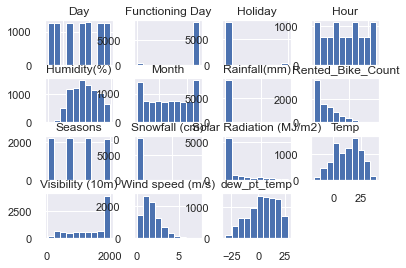

In [17]:
# plot histograms for all numeric columns 
data.hist() 

In [18]:
# Pandas profiling report
pandas_profiling.ProfileReport(data)

In [19]:
# Calculate covariance
covMat = data.cov()
print(covMat)

                                  Day  Rented_Bike_Count          Hour  \
Day                      3.992229e+00         -37.833936 -6.053688e-17   
Rented_Bike_Count       -3.783394e+01      416021.733390  1.831818e+03   
Hour                    -6.053688e-17        1831.818358  4.792214e+01   
Temp                    -9.886129e-02        4072.676191  1.011114e+01   
Humidity(%)             -3.100160e-01       -2623.853782 -3.406222e+01   
Wind speed (m/s)        -4.438838e-02          80.950203  2.045964e+00   
Visibility (10m)        -3.183284e+01       78187.849382  4.158507e+02   
dew_pt_temp             -3.596611e-01        3199.299111  2.761502e-01   
Solar Radiation (MJ/m2)  1.836526e-02         146.717508  8.728125e-01   
Rainfall(mm)            -4.005805e-02         -89.558657  6.806142e-02   
Snowfall (cm)           -1.018400e-02         -39.946114 -6.505309e-02   
Seasons                 -1.343745e-03        -214.012950 -9.227564e-18   
Holiday                 -1.931540e-02 

In [20]:
# Correlation coefficient matrix
corrMat = data.corr()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf8a4eceb0>]],
      dtype=object)

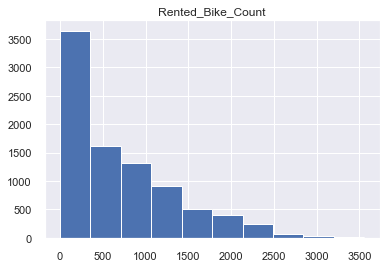

In [21]:
# Histogram of rented bike count 
data.hist('Rented_Bike_Count')

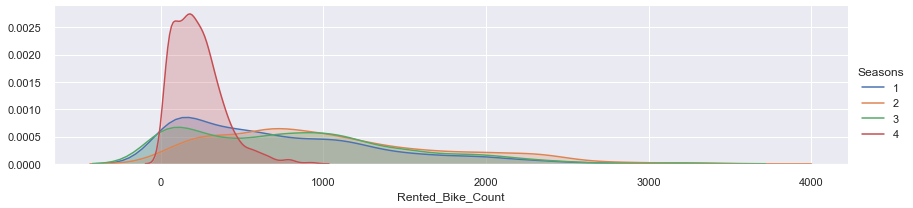

In [22]:
# Graph = Rented Bike Count by Season 
fig = sns.FacetGrid(data, hue='Seasons', aspect=4)
fig.map(sns.kdeplot, 'Rented_Bike_Count', shade=True)
fig.add_legend()
## In winter, they typically have less than 500 people biking
## In Summer, they typically have more than 500 bikers

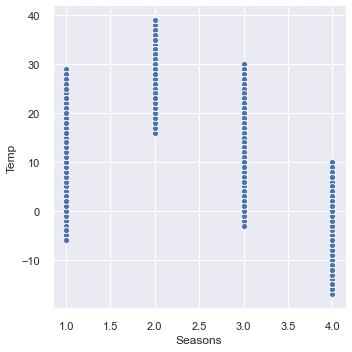

In [23]:
# Temperature Range by Season
sns.relplot('Seasons','Temp',data=data)
## Spring & Fall have comparable temp (-5 to 30)
## Summer is the hottest (15 to 40)
## Winter is the coldest (-18 to 10)

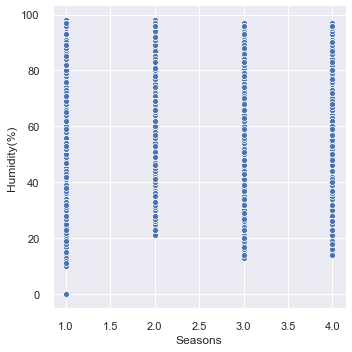

In [24]:
# Humidity by Season
sns.relplot('Seasons','Humidity(%)',data=data)
## All about the same. 

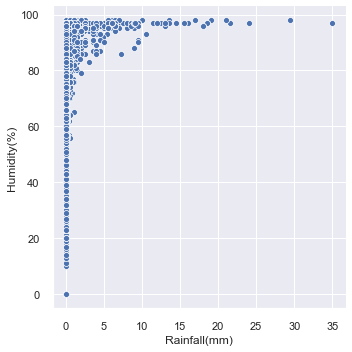

In [25]:
# Rainfall & Humidity 
sns.relplot('Rainfall(mm)','Humidity(%)', data=data)
## When it rains, it's very humid; however, it can be 100% humid with no rain.

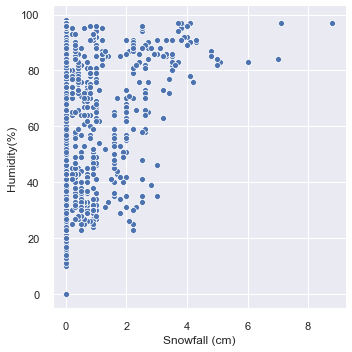

In [26]:
# Snowfall & Humidity
sns.relplot('Snowfall (cm)','Humidity(%)', data=data)
## Snowfall = higher humdity

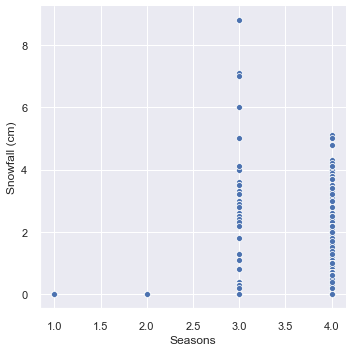

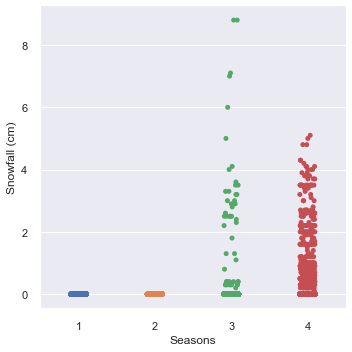

In [27]:
# Frequency & amount of snowfall by season
sns.relplot('Seasons','Snowfall (cm)',data=data)
sns.catplot('Seasons', 'Snowfall (cm)',data=data)
## It doesn't snow in Spring nor Summer. 
## It snowed 25 days in Winter and 3 days in Fall. Interestingly, Fall had the highest single day amount of snow with 8.8cm. 

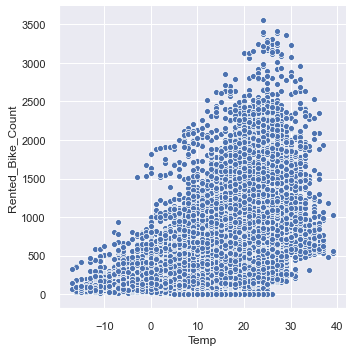

In [28]:
# Scatter plot bikes rented by temperature. 
sns.relplot('Temp','Rented_Bike_Count',data=data)
## When it's colder than -10 degrees, less than 500 bikes are rented
## There is a positive correlation between the temperatre rising and the number of bikes rented increasing. 

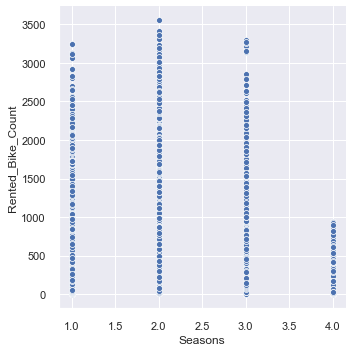

In [29]:
# Scatter plot of bikes rented by season 
sns.relplot('Seasons','Rented_Bike_Count',data=data)
## Winter has a considerably less rentals than the other seasons. 

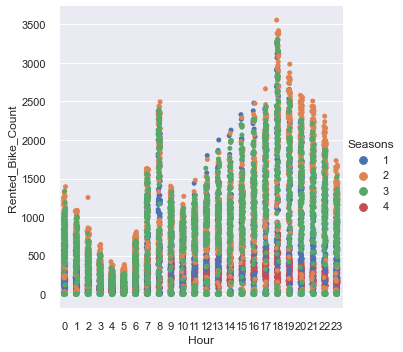

In [30]:
# Bike rented by hour & season 
sns.catplot('Hour','Rented_Bike_Count' , hue='Seasons', data=data)
## Peaks at 7, 8, 18, 19 (possibly traveling to and from work). 

In [31]:
## From the graph above we can see there are peaks around 7,8,18,19 (possibly commuting hours). 
## create a new data point for weekend vs weekday. 
booleans = []
for weekday in data.Day:
        if weekday <= 5:
            booleans.append(True)
        else:
            booleans.append(False)
            
            
## This can also be written more simply like this: 
        ## data[data.Day <= 5]
    ## or
        ## weekday = data.Day <=5

In [32]:
# Boolean head - confirm boolean is working
booleans[0:5]

[True, True, True, True, True]

In [33]:
# confirm length of boolean matches length of dataset. 
len(booleans)

8760

In [34]:
# Convert booleans list to panda series 
weekday = pd.Series(booleans)

In [35]:
# Add weekday indicator to dataset 
data['weekday'] = weekday 

In [36]:
# Confirm 'weekday' has been added
data.head()

,Date,Day,Rented_Bike_Count,Hour,Temp,Humidity(%),Wind speed (m/s),Visibility (10m),dew_pt_temp,Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,weekday
0,2017-12-01,5,254,0,-5,37,2.2,2000,-17.6,0.0,0.0,0.0,4,0,1,12,True
1,2017-12-01,5,204,1,-5,38,0.8,2000,-17.6,0.0,0.0,0.0,4,0,1,12,True
2,2017-12-01,5,173,2,-6,39,1.0,2000,-17.7,0.0,0.0,0.0,4,0,1,12,True
3,2017-12-01,5,107,3,-6,40,0.9,2000,-17.6,0.0,0.0,0.0,4,0,1,12,True
4,2017-12-01,5,78,4,-6,36,2.3,2000,-18.6,0.0,0.0,0.0,4,0,1,12,True


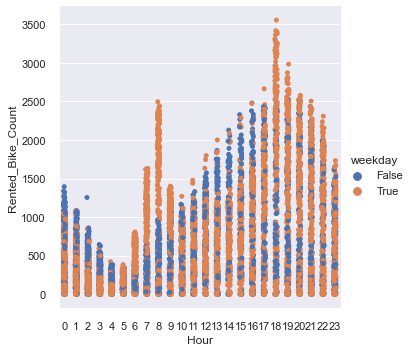

In [37]:
## Bike rented by hour & weekday vs weekend
sns.catplot('Hour','Rented_Bike_Count' , hue='weekday', data=data)
## Based on the graph, the peak rentals hours (7,8,18,19) are typically on weekdays.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf7473efa0>]],
      dtype=object)

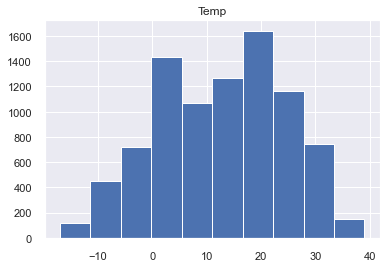

In [38]:
# Histogram (frequency) of temperature data
data.hist('Temp') 

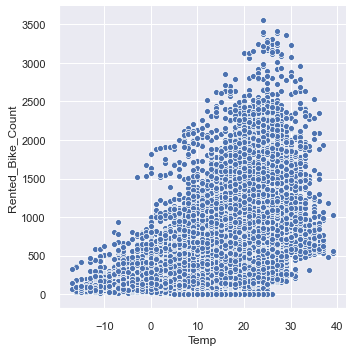

In [39]:
# Scatter plot of biked rented based on temperature. 
sns.relplot('Temp','Rented_Bike_Count',data=data)
## Most bikes rented between 20 - 30 degrees. 

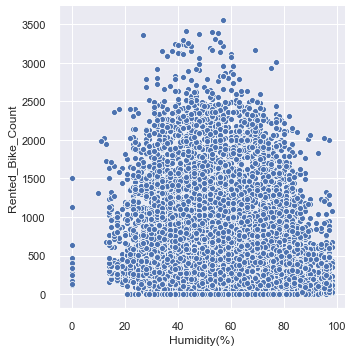

In [40]:
# Scatter plot of bikes rented by humdity. 
sns.relplot('Humidity(%)','Rented_Bike_Count',data=data)
## This presented a bell curve where lots of bikes were rented when humidity was between 40 - 60

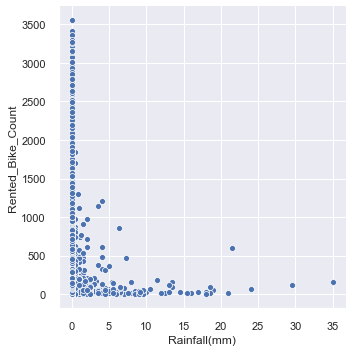

In [41]:
# Scatter plot of rainfall vs. bikes rented. 
sns.relplot('Rainfall(mm)','Rented_Bike_Count',data=data)
## The more it rains the less bikes are rented. 

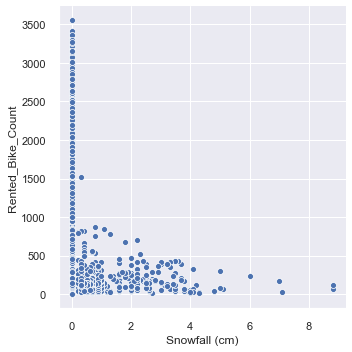

In [42]:
# Scatter plot of snowfall vs. bikes rented. 
sns.relplot('Snowfall (cm)','Rented_Bike_Count',data=data)
## The more it snows the less bikes are rented. 

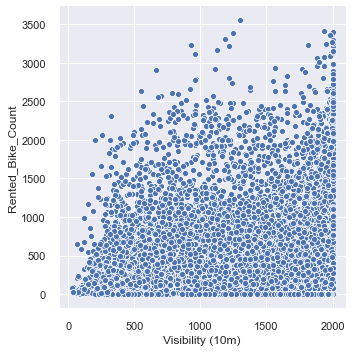

In [43]:
# Scatter plot of visibility vs. bikes rented. 
sns.relplot('Visibility (10m)','Rented_Bike_Count',data=data)
## When there is less visibility bikes are rented less frequently. 

In [45]:
#########################
## Business Question 1 ##
#########################
# Is there a day of the week when bikes are rented more than others?

# Mean of bikes rented sorted by day 
data.groupby('Day')['Rented_Bike_Count'].mean()

Day
1    730.563301
2    687.977564
3    740.349359
4    690.704327
5    747.117925
6    709.528846
7    625.155449
Name: Rented_Bike_Count, dtype: float64

In [46]:
# Sum of bikes rented sorted by day 
data.groupby('Day')['Rented_Bike_Count'].sum()

Day
1    911743
2    858596
3    923956
4    861999
5    950334
6    885492
7    780194
Name: Rented_Bike_Count, dtype: int64

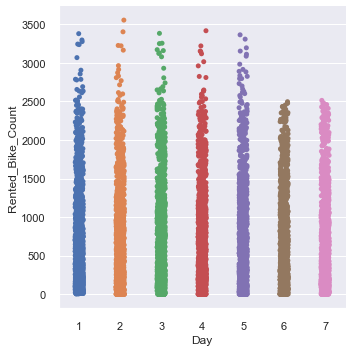

In [47]:
# Scatter plot of rented bikes by day or week 
sns.catplot('Day','Rented_Bike_Count', data=data)

## Most bikes are rented on Friday and least on Sunday 

In [48]:
#########################
## Business Question 2 ##
#########################
#Is there a season when bikes are rented more than others?

# Mean of bikes rented sorted by Season  
data.groupby('Seasons')['Rented_Bike_Count'].mean()

Seasons
1     730.031250
2    1034.073370
3     819.597985
4     225.541204
Name: Rented_Bike_Count, dtype: float64

In [49]:
# Sum of bikes rented sorted by season
data.groupby('Seasons')['Rented_Bike_Count'].sum()

Seasons
1    1611909
2    2283234
3    1790002
4     487169
Name: Rented_Bike_Count, dtype: int64

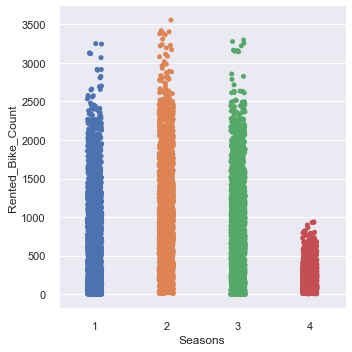

In [51]:
# Sum of bikes rented sorted by day 
sns.catplot('Seasons','Rented_Bike_Count', data=data)
## Most bikes are rented in Summer and least in Winter 

In [50]:
#########################
## Business Question 3 ##
#########################
#Is there an hour when bikes are rented the most?

# Mean of bikes rented sorted by hour  
data.groupby('Hour')['Rented_Bike_Count'].mean()

Hour
0      541.460274
1      426.183562
2      301.630137
3      203.331507
4      132.591781
5      139.082192
6      287.564384
7      606.005479
8     1015.701370
9      645.983562
10     527.821918
11     600.852055
12     699.441096
13     733.246575
14     758.824658
15     829.186301
16     930.621918
17    1138.509589
18    1502.926027
19    1195.147945
20    1068.964384
21    1031.449315
22     922.797260
23     671.126027
Name: Rented_Bike_Count, dtype: float64

In [52]:
# Sum of bikes rented sorted by hour
data.groupby('Hour')['Rented_Bike_Count'].sum()

Hour
0     197633
1     155557
2     110095
3      74216
4      48396
5      50765
6     104961
7     221192
8     370731
9     235784
10    192655
11    219311
12    255296
13    267635
14    276971
15    302653
16    339677
17    415556
18    548568
19    436229
20    390172
21    376479
22    336821
23    244961
Name: Rented_Bike_Count, dtype: int64

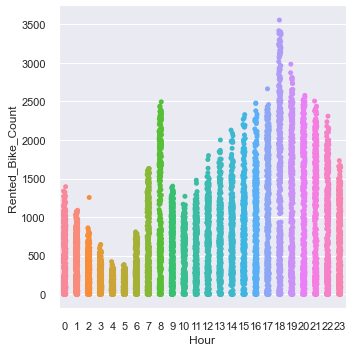

In [53]:
# Scatter plot of bikes rented by hour. 
sns.catplot('Hour', 'Rented_Bike_Count', data=data)
## On average, less than 150 bikes are rented at 4:00 & 5:00. 
## More than 1,000 bikes are rented on average at 8:00 and from 17:00 – 21:00. 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf76763490>]],
      dtype=object)

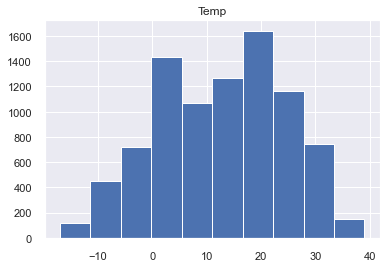

In [54]:
#########################
## Business Question 4 ##
#########################
# Is there a temperature when the most bikes are rented? 

# Histogram of temperature
data.hist('Temp')

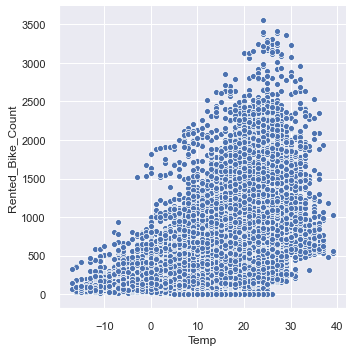

In [55]:
# Scatter plot of bikes rented by temp. 
sns.relplot('Temp','Rented_Bike_Count',data=data)

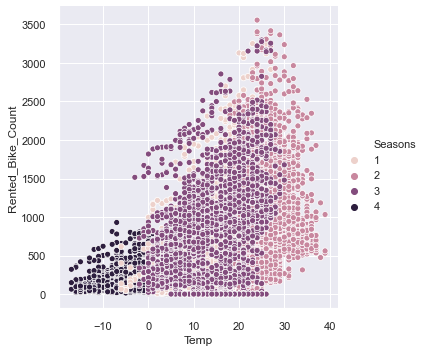

In [56]:
# Scatter plot of bikes rented by temp & season 
sns.relplot('Temp','Rented_Bike_Count', hue='Seasons', data=data)

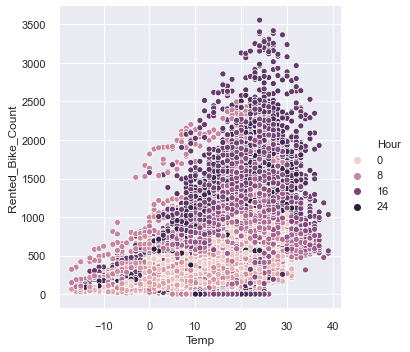

In [57]:
# Scatter plot of bikes rented by temp & hour 
sns.relplot('Temp','Rented_Bike_Count', hue='Hour', data=data)

In [58]:
# Create bins for hourly temp 
hourly_temp = ['1','2','3','4','5','6','7','8','9','10','11','12']
cut_bins1 = [-18, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40]
data['hourly_temp'] = pd.cut(data['Temp'], bins=cut_bins1, labels=hourly_temp)

In [59]:
# Update data types to numeric. 
cols = ['hourly_temp']
data[cols] = data[cols].apply(pd.to_numeric, errors='coerce', axis=1) 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf8af42a60>]],
      dtype=object)

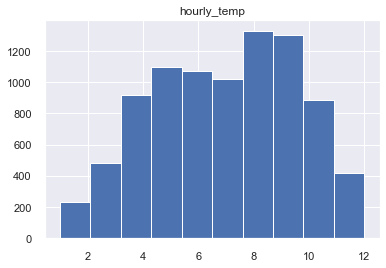

In [60]:
# Histogram of hourly temperature (binned) 
data.hist('hourly_temp')

In [61]:
# Mean of bikes rented sorted by hourly temp
data.groupby('hourly_temp')['Rented_Bike_Count'].mean()

hourly_temp
1      104.652174
2      150.741758
3      177.180498
4      237.132898
5      359.300546
6      547.994393
7      709.345437
8      869.956456
9     1105.448698
10    1216.847973
11    1106.162088
12     865.181818
Name: Rented_Bike_Count, dtype: float64

In [62]:
# Sum of bikes rented sorted by hour
data.groupby('hourly_temp')['Rented_Bike_Count'].sum()

hourly_temp
1        4814
2       27435
3       85401
4      217688
5      394512
6      586354
7      722823
8     1158782
9     1443716
10    1080561
11     402643
12      47585
Name: Rented_Bike_Count, dtype: int64

In [63]:
# Pivot Table: Average bike rentals by seasons & temperature
print(pd.pivot_table(data, index = 'Seasons', columns = 'hourly_temp', values = 'Rented_Bike_Count' ,aggfunc ='mean'))
## The temperature with the most rented bikes is 21 to 35 degrees with over 1000 bikes rented on average.  
## The colder temperatures (0* or less) no more than 300 bikes are rented on average. 

hourly_temp          1           2           3           4           5   \
Seasons                                                                   
1                   NaN         NaN  197.857143  237.574468  331.264901   
2                   NaN         NaN         NaN         NaN         NaN   
3                   NaN         NaN         NaN  574.102564  561.237354   
4            104.652174  150.741758  176.875789  221.312500  278.723562   

hourly_temp          6           7            8            9            10  \
Seasons                                                                      
1            441.493927  640.293381  1029.281369  1368.397541  1655.275862   
2                   NaN         NaN   653.438356  1020.515110  1169.397919   
3            676.971429  793.258696   829.914397  1098.479042  1481.011111   
4            424.883721         NaN          NaN          NaN          NaN   

hourly_temp           11          12  
Seasons                               
1 

In [64]:
##############
## Model 1 ##
##############
# Can we predict how many bikes will be rented in the future?

# define features - for the first model we will use all features. 
features = ['Day','Hour', 'Temp', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'dew_pt_temp',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day','Month']
X = data[features].copy()

In [65]:
# define dependent variable
y = data['Rented_Bike_Count']

In [66]:
# Configure Algorithms
algosClass = []
algosClass.append(('Random Forest Regressor',RandomForestRegressor()))
algosClass.append(('Linear Regression',LinearRegression()))
algosClass.append(('Support Vector Regression',SVR()))

In [67]:
# Regression
results = []
names = []
for name, model in algosClass:
    result = cross_val_score(model, X,y, cv=5, scoring='r2')
    names.append(name)
    results.append(result)

In [68]:
# print r2 results to determine best algorithm
for i in range(len(names)):
    print(names[i],results[i].mean())

Random Forest Regressor -0.006699642613413559
Linear Regression -0.9466040479942596
Support Vector Regression -2.8199988610712317


In [69]:
# create the necessary training and testing data (75/25)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state = 123)

In [70]:
#Modeling (Regression)
algo = RandomForestRegressor()
model = algo.fit(X_train,y_train)

In [71]:
# Print CV score
print(cross_val_score(model, X, y, cv=5))

[-2.87139644  0.52612338  0.80311423  0.66631247  0.70378485]


In [72]:
# Train Set Predictions
predictions_train = model.predict(X_train)
predRsquared = r2_score(y_train,predictions_train)
rmse = sqrt(mean_squared_error(y_train, predictions_train))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.990
RMSE: 64.495


In [73]:
# Test Set Predictions
predictions_test = model.predict(X_test)
predRsquared = r2_score(y_test,predictions_test)
rmse = sqrt(mean_squared_error(y_test, predictions_test))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.929
RMSE: 168.621


In [75]:
print(predictions_test)

[ 180.65  772.21 2093.49 ... 1827.84  364.03 1484.47]


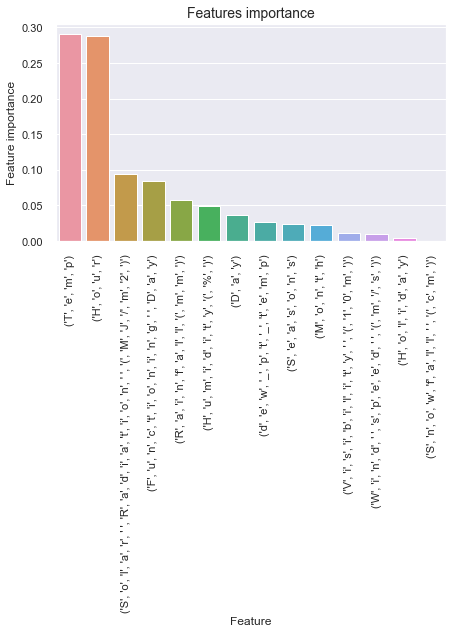

In [76]:
# Variable Importance
tmp = pd.DataFrame({'Feature': X, 'Feature importance': algo.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

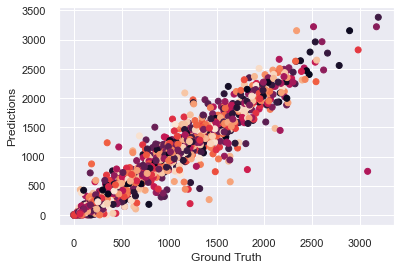

In [77]:
# Predictions vs. Ground Truth scatter plot
rng = np.random.RandomState(0)
colors = rng.rand(2190)
plt.scatter(predictions_test, y_test, c=colors ,alpha = 1)
plt.xlabel('Ground Truth')
plt.ylabel('Predictions')
plt.show();

In [81]:
# Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [79]:
# Look at predictions on training and validation set
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

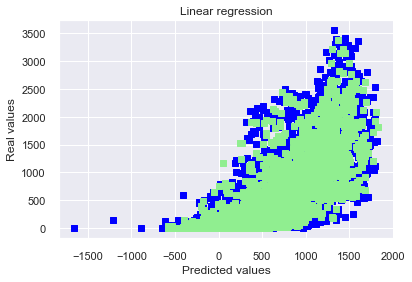

In [80]:
# Plot predictions
plt.scatter(y_train_pred, y_train, c = "blue", marker = "s", label = "Training data")
plt.scatter(y_test_pred, y_test, c = "lightgreen", marker = "s", label = "Validation data")
plt.title("Linear regression")
plt.xlabel("Predicted values")
plt.ylabel("Real values")
plt.show()

In [82]:
##############
## Model 2 ##
##############
# We know temp is a significant feature - let's try to bin temperatures and see if R2 increases. 

#define features
features = ['Day','Month','Hour', 'hourly_temp', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'dew_pt_temp',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
       'Holiday', 'Functioning Day']
X = data[features].copy()

In [83]:
# define dependent variable
y = data['Rented_Bike_Count']

In [84]:
# Configure Algorithms
algosClass = []
algosClass.append(('Random Forest Regressor',RandomForestRegressor()))
algosClass.append(('Linear Regression',LinearRegression()))
algosClass.append(('Support Vector Regression',SVR()))

In [85]:
# Regression
results = []
names = []
for name, model in algosClass:
    result = cross_val_score(model, X,y, cv=5, scoring='r2')
    names.append(name)
    results.append(result)

In [86]:
# print r2 results to determine best algorithm
for i in range(len(names)):
    print(names[i],results[i].mean())

Random Forest Regressor -0.1403551952158884
Linear Regression -1.0674096590860092
Support Vector Regression -2.8227478165918956


In [90]:
# create the necessary training and testing data (75/25)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .25, random_state = 123)

In [91]:
#Modeling (Regression)
algo = RandomForestRegressor()
model = algo.fit(X_train,y_train)

In [92]:
# Print CV score
print(cross_val_score(model, X, y, cv=5))

[-3.51763647  0.61180898  0.78956456  0.65693682  0.71770141]


In [93]:
# Train Set Predictions
predictions_train = model.predict(X_train)
predRsquared = r2_score(y_train,predictions_train)
rmse = sqrt(mean_squared_error(y_train, predictions_train))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.990
RMSE: 64.801


In [94]:
# Test Set Predictions
predictions_test = model.predict(X_test)
predRsquared = r2_score(y_test,predictions_test)
rmse = sqrt(mean_squared_error(y_test, predictions_test))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.925
RMSE: 173.585


In [95]:
print(predictions_test)

[ 198.52  786.65 2134.53 ... 1741.01  350.33 1367.17]


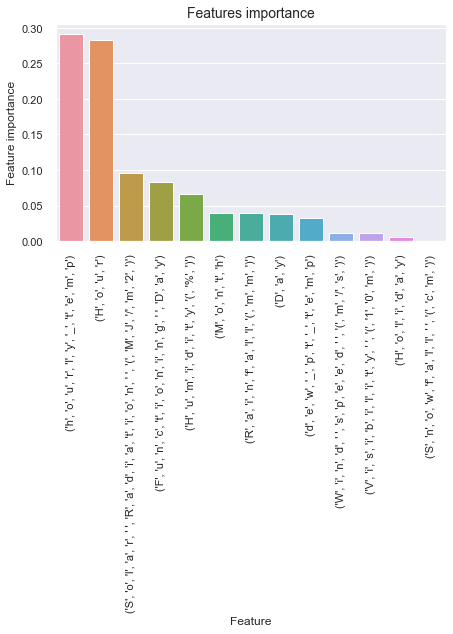

In [96]:
# Variable Importance
tmp = pd.DataFrame({'Feature': X, 'Feature importance': algo.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

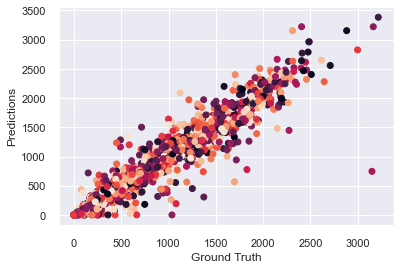

In [97]:
# Predictions vs. Ground Truth scatter plot
rng = np.random.RandomState(0)
colors = rng.rand(2190)
plt.scatter(predictions_test, y_test, c=colors ,alpha = 1)
plt.xlabel('Ground Truth')
plt.ylabel('Predictions')
plt.show();